# **Udacity CARND - Advanced Lane Lines** 
***
The goals / steps of this project are the following:  

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply the distortion correction to the raw image.  
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view"). 
* Detect lane pixels and fit to find lane boundary.
* Determine curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
---

In [3]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

This image is: <class 'numpy.ndarray'> with dimesions: (540, 960, 3)


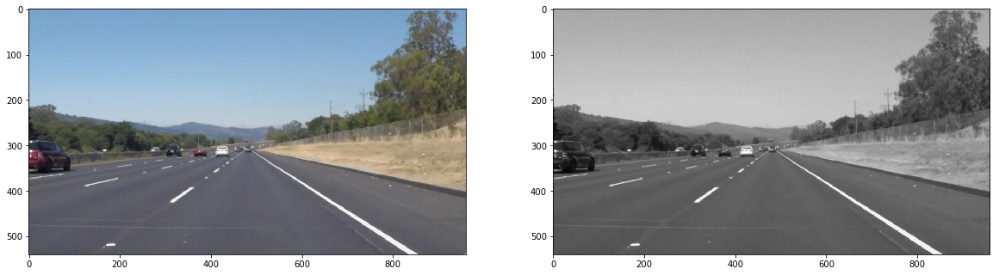

In [4]:
# reading in an image, as always visualize the dataset first ;D
fig = plt.figure(figsize=(20, 8))
image = mpimg.imread('test_images/solidWhiteRight.jpg')
print('This image is:', type(image), 'with dimesions:', image.shape)
fig.add_subplot(1,2,1)
plt.imshow(image)  # call as plt.imshow(gray, cmap='gray') to show a grayscaled image
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
fig.add_subplot(1,2,2)
plt.imshow(gray, cmap='gray')

In [5]:
# find factors automatically
def factorsFind(num):
    bestDivider = 1
    for i in range(2,int(num/2)):
        if num%i == 0:
            bestDivider = i
    return bestDivider, int(num/bestDivider)

In [6]:
print(factorsFind(55))

(11, 5)


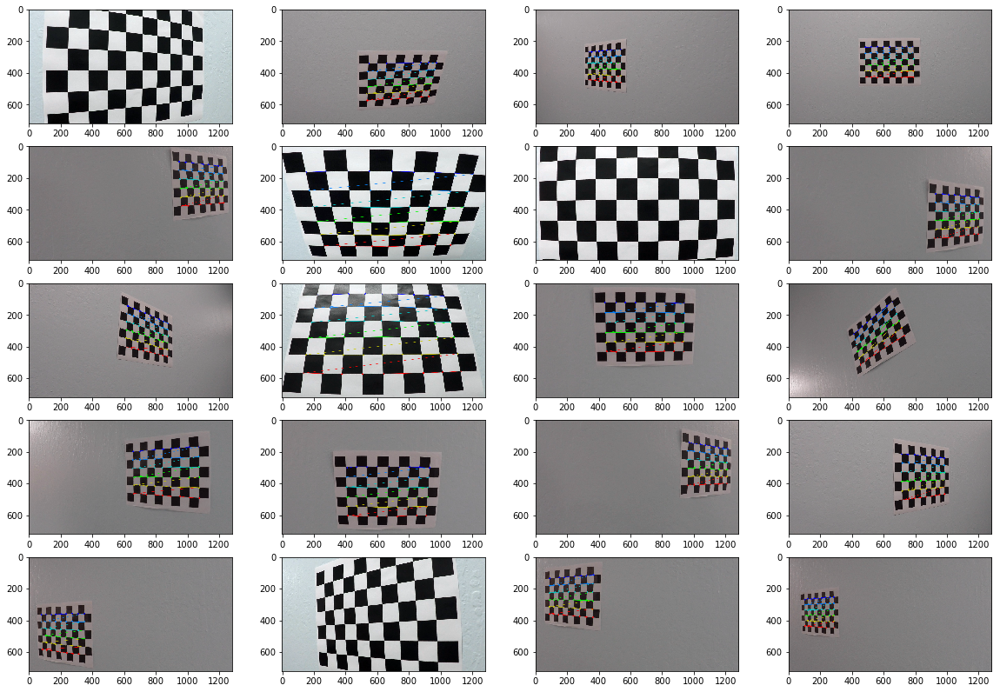

In [7]:
import glob
nx = 9
ny = 6
counter = 1

objp = np.zeros((nx * ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

directory = './camera_cal/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir))
fig = plt.figure(figsize=(20, 14))
distDic = {'imagePoints':[],'objectPoints':[]}
for filename in globDir:
    # load image 
    img = cv2.imread(filename)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    if ret == True:
        distDic['imagePoints'].append(corners)
        distDic['objectPoints'].append(objp)
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret) 
    plt.imshow(img) 

In [8]:
# save pickle file
import pickle
with open('calibrator.pickle', 'wb') as handle:
    pickle.dump(distDic, handle, protocol=pickle.HIGHEST_PROTOCOL)

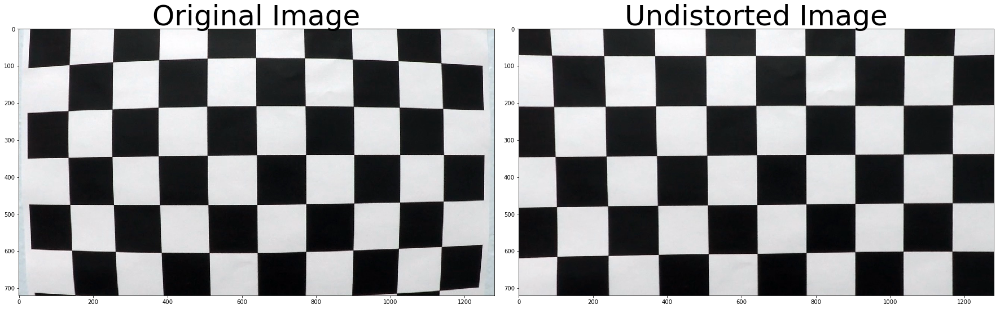

In [9]:
# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read in the saved objpoints and imgpoints
distPickle = pickle.load( open( "calibrator.pickle", "rb" ) )
objPoints = distPickle["objectPoints"]
imgPoints = distPickle["imagePoints"]

# Read in an image
img = cv2.imread('./camera_cal/calibration1.jpg')

# takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def calUndistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx) 
    return undist

undistorted = calUndistort(img, objPoints, imgPoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

This image is: <class 'numpy.ndarray'> with dimesions: (540, 960, 3)


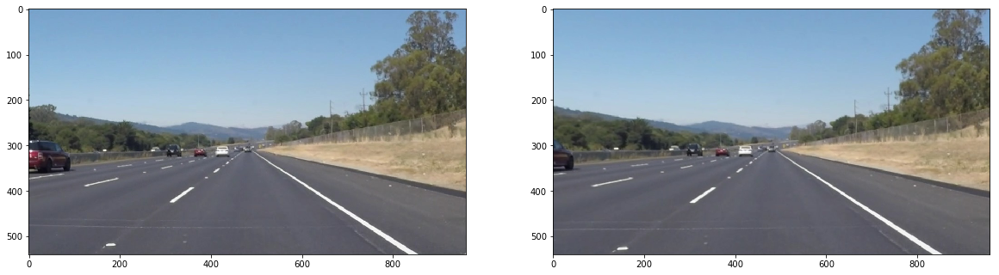

In [10]:
# reading in an image, as always visualize the dataset first ;D
fig = plt.figure(figsize=(20, 8))
image = mpimg.imread('test_images/solidWhiteRight.jpg')
print('This image is:', type(image), 'with dimesions:', image.shape)
fig.add_subplot(1,2,1)
plt.imshow(image)  # call as plt.imshow(gray, cmap='gray') to show a grayscaled image
undistorted = calUndistort(image, objPoints, imgPoints)
fig.add_subplot(1,2,2)
plt.imshow(undistorted)

In [39]:
# helpers functions
def dirThreshold(img, sobelKernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobelKernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobelKernel)
    absSobelx = np.absolute(sobelx)
    absSobely = np.absolute(sobely)
    #abs_sobelxy = np.sqrt(np.power(sobelx,2) + np.power(sobelx,2))
    direction = np.arctan2(absSobely, absSobelx)
    threshMin = thresh[0]
    threshMax = thresh[1]
    scaledSobel = direction
    sxbinary = np.zeros_like(direction)
    sxbinary[(scaledSobel >= threshMin) & (scaledSobel <= threshMax)] = 1
    binaryOutput = sxbinary
    return binaryOutput
def absSobelThresh(img, sobelKernel=3, orient='x', thresh=(0, 255)):
    threshMin=thresh[0]
    threshMax=thresh[1]
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobelOp = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobelKernel)
    else:
        sobelOp = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobelKernel)
    absSobel = np.absolute(sobelOp)
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaledSobel = np.uint8(255*absSobel/np.max(absSobel))
    sxbinary = np.zeros_like(scaledSobel)
    sxbinary[(scaledSobel > threshMin) & (scaledSobel < threshMax)] = 1
    binaryOutput = sxbinary 
    return binaryOutput
def magThresh(img, sobelKernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobelKernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobelKernel)
    magnitudeX = np.absolute(sobelx)
    magnitudeY = np.absolute(sobely)
    magnitudeXY = np.sqrt(np.power(sobelx, 2) + np.power(sobely, 2) )
    scaledXY = np.uint8(255*magnitudeXY/np.max(magnitudeXY))
    # Create a binary mask where mag thresholds are met
    threshMin = thresh[0]
    threshMax = thresh[1]
    binaryOutput = np.zeros_like(scaledXY)
    binaryOutput[(scaledXY >= threshMin) & (scaledXY <= threshMax)] = 1
    return binaryOutput
def combinedThreshBinaryImg(img, threshX=(20, 100), threshY=(20, 100), threshColorS=(170,255), threshColorU=(0,110), threshColorR=(230,255)):
    # Convert to HLS color space and separate the H channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float)
    yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV).astype(np.float)
    # H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    R = rgb[:,:,0]
    U = yuv[:,:,1]
    # Sobel 
    sobelX = absSobelThresh(img, orient='x', thresh=(threshX[0], threshX[1]))
    sobelY = absSobelThresh(img, orient='y', thresh=(threshY[0], threshY[1]))

    # Threshold color channel
    sBinary = np.zeros_like(S)
    sBinary[(S >= threshColorS[0]) & (S <= threshColorS[1])] = 1
    
    rBinary = np.zeros_like(R)
    rBinary[(R >= threshColorR[0]) & (R <= threshColor[1])] = 1
    
    uBinary = np.zeros_like(U)
    uBinary[(U >= threshColorU[0]) & (U <= threshColorU[1])] = 1    
    
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    # colorBinary = np.dstack(( np.zeros_like(sobelX), sobelX, sBinary))
    
    colorBinary = np.dstack(( rBinary, ((sobelX == 1) & (sobelY == 1)), uBinary ))
    # if you want to see colorful Output uncomment this line
    # return colorBinary
    
    # Combine the two binary thresholds 
    combinedBinary = np.zeros_like(sBinary)
    combinedBinary[(rBinary == 1) | (uBinary == 1) | ((sobelX == 1) & (sobelY == 1))] = 1
    
    return combinedBinary

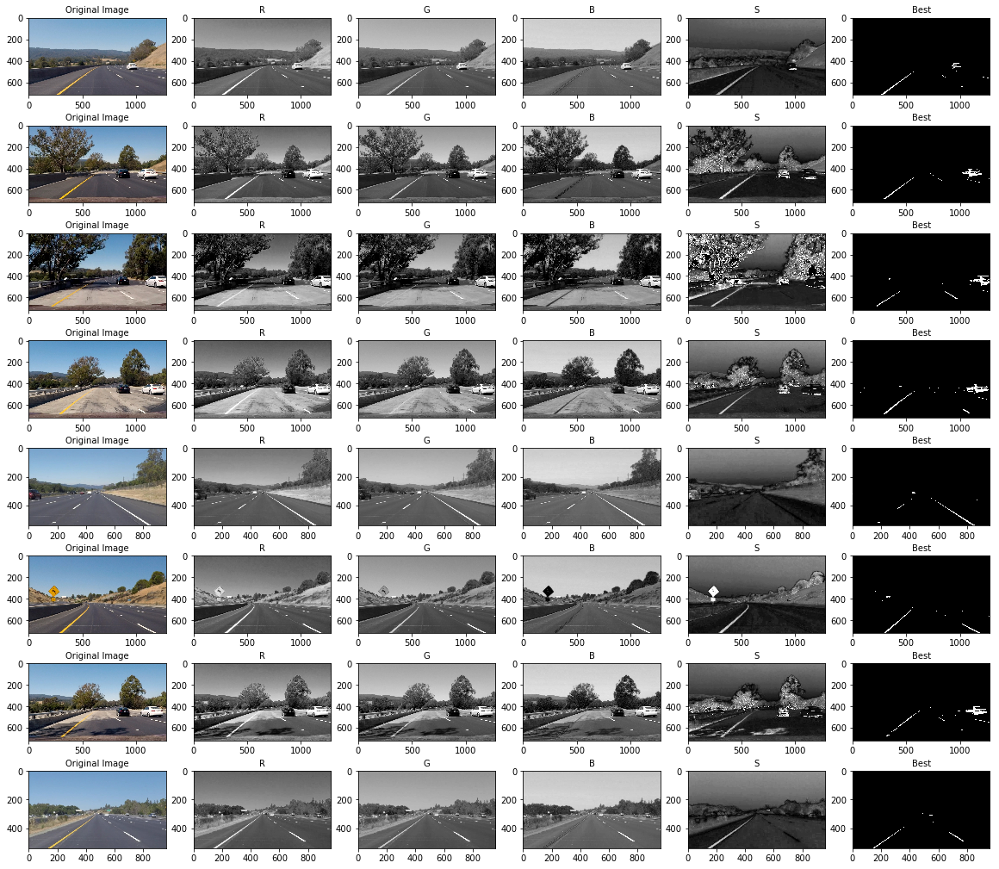

In [12]:
import glob
directory = './test_images/*.jpg'
globDir = glob.glob(directory)
#factors = factorsFind(len(globDir)*5)
factors = [len(globDir),6]
# print(len(globDir),factors)
fig = plt.figure(figsize=(20, 18))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.title('Original Image', fontsize=10)
    
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float)
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    
    kSize = 9
    afterProcess = rgb[:,:,0]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('R', fontsize=10)
    
    kSize = 9
    afterProcess = rgb[:,:,1]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('G', fontsize=10)
    
    kSize = 9
    afterProcess = rgb[:,:,2]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('B', fontsize=10)
    
    kSize = 9
    afterProcess = hsv[:,:,1]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('S', fontsize=10)
    
    # best combine solution
    kSize = 9
    # afterProcess = combinedThreshBinaryImg(img, threshX=(20, 100), threshY=(20, 100), threshColor=(170,255))
    
    L = hls[:,:,1]
    S = hls[:,:,2]
    R = rgb[:,:,0]
    # print(R.shape, L.shape, S.shape)
    threshX=(20, 100) 
    threshY=(20, 100) 
    threshColor=(230, 255)

    # Threshold color channel
    sBinary = np.zeros_like(S)
    sBinary[(S >= threshColor[0]) & (S <= threshColor[1])] = 1
    
    lBinary = np.zeros_like(L)
    lBinary[(L >= threshColor[0]) & (L <= threshColor[1])] = 1
    
    rBinary = np.zeros_like(R)
    rBinary[(R >= threshColor[0]) & (R <= threshColor[1])] = 1
    
    afterProcess = np.dstack(( rBinary, rBinary, rBinary))
    
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Best', fontsize=10)   

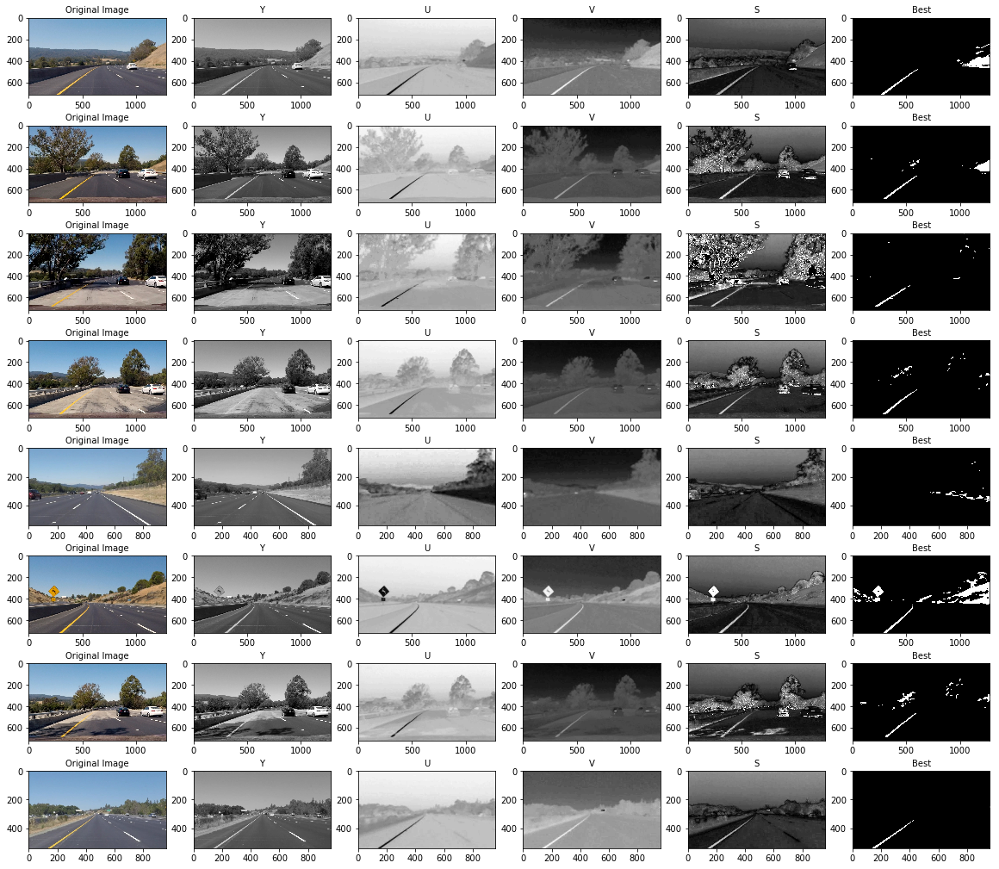

In [13]:
import glob
directory = './test_images/*.jpg'
globDir = glob.glob(directory)
#factors = factorsFind(len(globDir)*5)
factors = [len(globDir),6]
# print(len(globDir),factors)
fig = plt.figure(figsize=(20, 18))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.title('Original Image', fontsize=10)
    
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV).astype(np.float)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float)
    
    kSize = 9
    afterProcess = yuv[:,:,0]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Y', fontsize=10)
    
    kSize = 9
    afterProcess = yuv[:,:,1]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('U', fontsize=10)
    
    kSize = 9
    afterProcess = yuv[:,:,2]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('V', fontsize=10)
    
    kSize = 9
    afterProcess = hsv[:,:,1]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('S', fontsize=10)
    
    # best combine solution
    kSize = 9
    # afterProcess = combinedThreshBinaryImg(img, threshX=(20, 100), threshY=(20, 100), threshColor=(170,255))
    
    L = hls[:,:,1]
    S = hls[:,:,2]
    R = rgb[:,:,0]
    H = hls[:,:,0]
    U = yuv[:,:,1]
    threshX=(20, 100) 
    threshY=(20, 100) 
    threshColorS=(200, 255)
    threshColorL=(200, 255)
    threshColorR=(220, 255)
    threshColorU = (0,110)
    #threshColorH=(0, 50)

    # Threshold color channel
    sBinary = np.zeros_like(L)
    sBinary[(S >= threshColorS[0]) & (S <= threshColorS[1])] = 1
    
    lBinary = np.zeros_like(L)
    lBinary[(L >= threshColorL[0]) & (L <= threshColorL[1])] = 1

    uBinary = np.zeros_like(U)
    uBinary[(U >= threshColorU[0]) & (U <= threshColorU[1])] = 1
    
    rBinary = np.zeros_like(R)
    rBinary[(R >= threshColorR[0]) & (R <= threshColorR[1])] = 1
    
    afterProcess = np.dstack(( uBinary, uBinary, uBinary))
    
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Best', fontsize=10)   

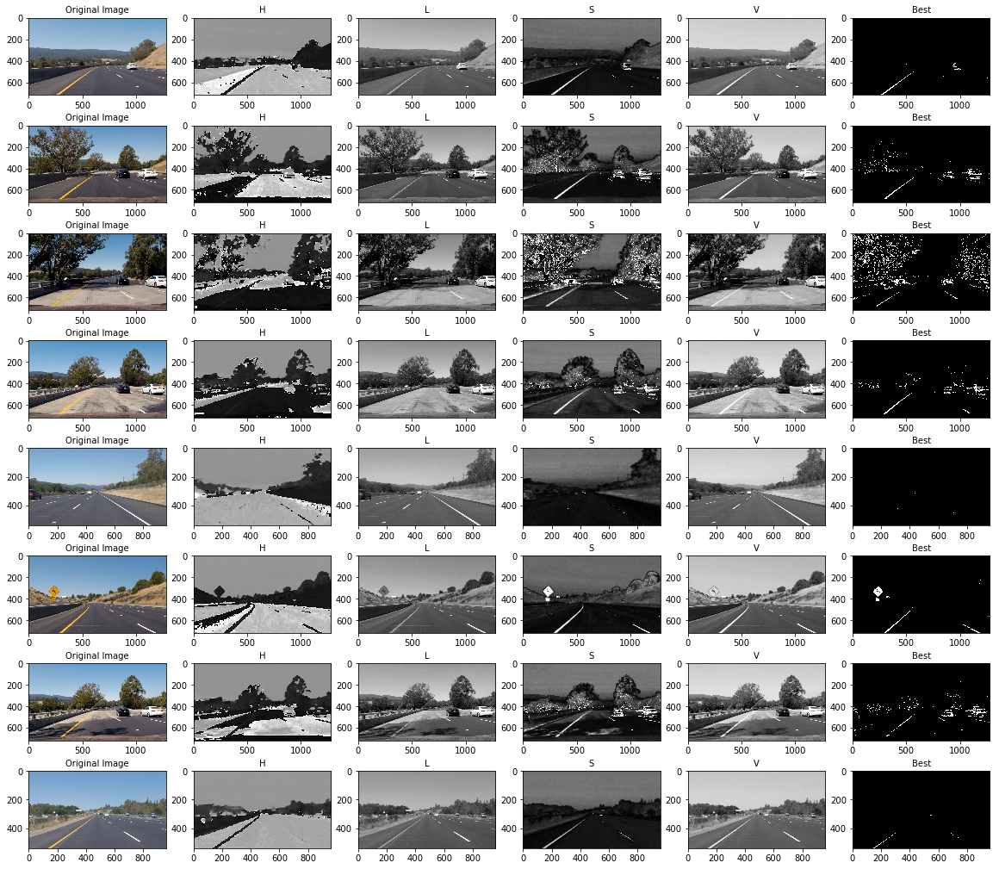

In [14]:
import glob
directory = './test_images/*.jpg'
globDir = glob.glob(directory)
#factors = factorsFind(len(globDir)*5)
factors = [len(globDir),6]
# print(len(globDir),factors)
fig = plt.figure(figsize=(20, 18))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.title('Original Image', fontsize=10)
    
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV).astype(np.float)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float)
    
    kSize = 9
    afterProcess = hls[:,:,0]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('H', fontsize=10)
    
    kSize = 9
    afterProcess = hls[:,:,1]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('L', fontsize=10)
    
    kSize = 9
    afterProcess = hls[:,:,2]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('S', fontsize=10)
    
    kSize = 9
    afterProcess = hsv[:,:,2]
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('V', fontsize=10)
    
    # best combine solution
    kSize = 9
    # afterProcess = combinedThreshBinaryImg(img, threshX=(20, 100), threshY=(20, 100), threshColor=(170,255))
    
    L = hls[:,:,1]
    S = hls[:,:,2]
    R = rgb[:,:,0]
    H = hls[:,:,0]
    threshX=(20, 100) 
    threshY=(20, 100) 
    threshColorS=(200, 255)
    threshColorL=(200, 255)
    threshColorR=(220, 255)
    #threshColorH=(0, 50)

    # Threshold color channel
    sBinary = np.zeros_like(L)
    sBinary[(S >= threshColorS[0]) & (S <= threshColorS[1])] = 1
    
    lBinary = np.zeros_like(L)
    lBinary[(L >= threshColorL[0]) & (L <= threshColorL[1])] = 1

    #hBinary = np.zeros_like(H)
    #hBinary[(H >= threshColorH[0]) & (H <= threshColorH[1])] = 1
    
    rBinary = np.zeros_like(R)
    rBinary[(R >= threshColorR[0]) & (R <= threshColorR[1])] = 1
    
    afterProcess = np.dstack(( sBinary, sBinary, sBinary))
    
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Best', fontsize=10)   

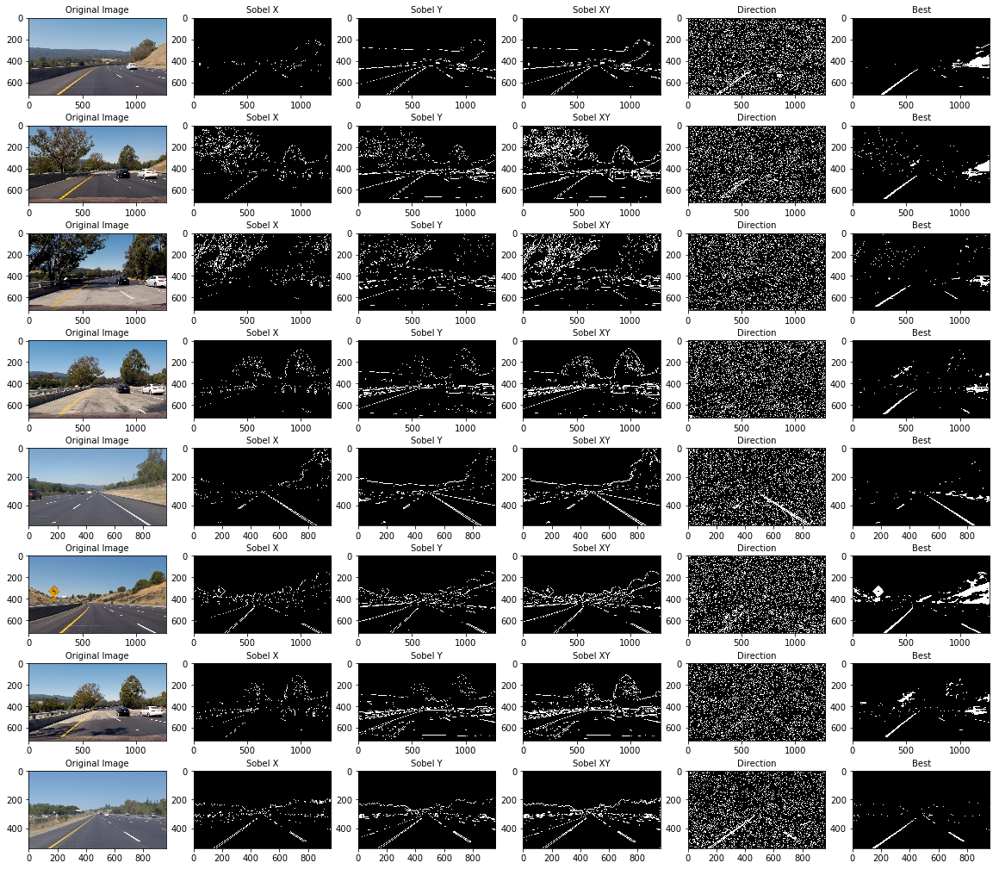

In [15]:
import glob
directory = './test_images/*.jpg'
globDir = glob.glob(directory)
#factors = factorsFind(len(globDir)*5)
factors = [len(globDir),6]
# print(len(globDir),factors)
fig = plt.figure(figsize=(20, 18))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.title('Original Image', fontsize=10)
    
    kSize = 9
    afterProcess = absSobelThresh(img, orient='x', sobelKernel=kSize, thresh=(45, 250))
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Sobel X', fontsize=10)
    
    kSize = 9
    afterProcess = absSobelThresh(img, orient='y', sobelKernel=kSize, thresh=(45, 255))
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Sobel Y', fontsize=10)
    
    kSize = 9
    afterProcess = magThresh(img, sobelKernel=kSize, thresh=(45, 255))
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Sobel XY', fontsize=10)
    
    kSize = 9
    afterProcess = dirThreshold(img, sobelKernel=kSize, thresh=(0.8, 1.1))
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Direction', fontsize=10)
    
    # best combine solution
    kSize = 9
    afterProcess = combinedThreshBinaryImg(img, threshX=(45, 255), threshY=(45, 255), threshColorS=(200,255), threshColorU=(0,110), threshColorR=(230,255))
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    plt.title('Best', fontsize=10)   

In [16]:
def processImg(img, objPoints, imgPoints):
    # Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    # Apply the distortion correction to the raw image.
    undist = calUndistort(img, objPoints, imgPoints)
    # Use color transforms, gradients, etc., to create a thresholded binary image.
    thrBinary = combinedThreshBinaryImg(img, threshX=(45, 255), threshY=(45, 255), threshColorS=(200,255), threshColorU=(0,110), threshColorR=(230,255))
    # Apply a perspective transform to rectify binary image ("birds-eye view").
    # Detect lane pixels and fit to find /lane boundary.
    # Determine curvature of the lane and vehicle position with respect to center.
    # Warp the detected lane boundaries back onto the original image.
    # Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    result = thrBinary
    return result

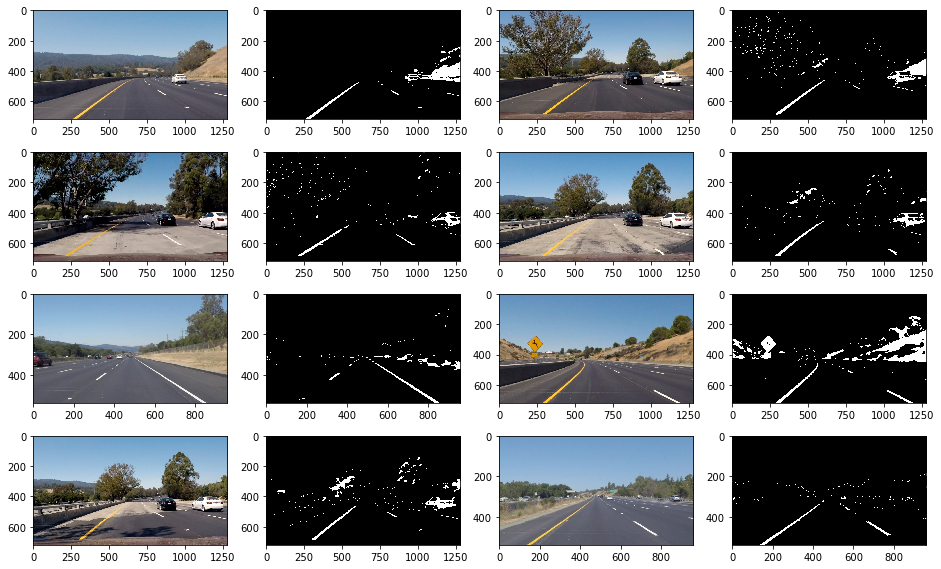

In [17]:
import glob
directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(16, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    afterProcess = processImg(img, objPoints, imgPoints)
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 

In [18]:
def regionOFInterest(img, vertices, color):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channelCount = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignoreMaskColor = (color,) * channelCount
    else:
        ignoreMaskColor = color
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignoreMaskColor)
    
    #returning the image only where mask pixels are nonzero
    maskedImage = cv2.bitwise_and(img, mask)
    return maskedImage

def colorProcessing(img, boundaries):
    result = np.zeros_like(img)  
    for (lower, upper) in boundaries:
        lower = np.array(lower, dtype = "uint8")
        upper = np.array(upper, dtype = "uint8")
        mask = cv2.inRange(img, lower, upper)
        output = cv2.bitwise_and(img, img, mask = mask)
        result = cv2.addWeighted(result, 1., output, 1., 0.)
    return result

def intelligentMaskDetection(lines, imshape, alpha=5, beta=10): # my special function to find mask in a more intelligent manner :D
    # find slope
    status = 1 # indicator that show us if the algorithm was successful or not
    
    slopes = []
    longestLineX1 = 0
    longestLineX2 = 0
    longestLineY1 = 0
    longestLineY2 = 0
    longestLine1 = 0
    longestLine2 = 0
    longestNSlope = 0 # default Parameter
    longestPSlope = 0 # default Parameter
    thr = 0.5
    
    if lines is None: # prevent none type error for lines
        status = 0 # do it manually
        # print('Manual Processing')
        xIntersect = -1.
        yIntersect = -1.
        maskVertices = np.array([(0,imshape[0]),(imshape[1]/2+3*imshape[0]/70, imshape[0]/3+imshape[0]/4), (imshape[1]/2+imshape[0]/70, imshape[0]/3+imshape[0]/4), (imshape[1],imshape[0])], dtype=np.float32)
        return maskVertices, xIntersect, yIntersect, status
    
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            slope = ((y2-y1)/(x2-x1))
            slopes.append(slope)
            euclideanDist = np.sqrt((y2-y1)**2+(x2-x1)**2)
            if (abs(slope)>thr):
                if ((np.sign(slope) > 0) & (not np.isnan(slope)) & (not np.isinf(slope))):
                    if euclideanDist >= longestLine1: # calculate Euclidean Distance
                        longestLine1 = euclideanDist
                        longestLineX1 =x1
                        longestLineY1 =y1
                        longestPSlope = slope
                elif ((np.sign(slope) < 0) & (not np.isnan(slope)) & (not np.isinf(slope))): 
                    if euclideanDist >= longestLine2: # calculate Euclidean Distance
                        longestLine2 = euclideanDist
                        longestLineX2 =x2
                        longestLineY2 =y2
                        longestNSlope = slope

    # more clever way to do mask
    npArray = np.array(slopes)
    npArray[np.isnan(npArray)] = 0
    npArray[np.isinf(npArray)] = 0

    negativeSlope = longestNSlope
    positiveSlope = longestPSlope

    x1 = longestLineX1
    y1 = longestLineY1
    x2 = longestLineX2
    y2 = longestLineY2 
    
    # using line y-y0 = m (x-x0) and a little bit of math we have:
    
    if (positiveSlope-negativeSlope) == 0.: # prevent division by zero
        status = 0 # do it manually
        # print('Manual Processing')
        xIntersect = -1.
        yIntersect = -1.
        maskVertices = np.array([(0,imshape[0]),(imshape[1]/2+3*imshape[0]/70, imshape[0]/3+imshape[0]/4), (imshape[1]/2+imshape[0]/70, imshape[0]/3+imshape[0]/4), (imshape[1],imshape[0])], dtype=np.float32)
        return maskVertices, xIntersect, yIntersect, status
    
    xIntersect = abs((positiveSlope * x1 - negativeSlope * x2 + y2 - y1)/(positiveSlope-negativeSlope))
    yIntersect = abs((positiveSlope*negativeSlope*(x1-x2)+positiveSlope*y2 - negativeSlope*y1)/(positiveSlope-negativeSlope))

    
    
    m = positiveSlope
    yDownLeft = imshape[0]
    xDownLeft = (yDownLeft - yIntersect)/m + xIntersect
    
    yIntersectLeft = yIntersect + beta
    xIntersectLeft = (yIntersectLeft - yDownLeft)/m + xDownLeft - alpha
    
    m = negativeSlope
    yDownRight = imshape[0]
    xDownRight = (yDownRight - yIntersect)/m + xIntersect
    
    yIntersectRight = yIntersect + beta
    xIntersectRight = (yIntersectRight - yDownRight)/m + xDownRight + alpha
    
    
    if np.isnan(xDownLeft) |  np.isnan(yDownLeft) |  np.isnan(xIntersectLeft) |  np.isnan(yIntersectLeft)  |  np.isnan(xIntersectRight) |  np.isnan(yIntersectRight) |  np.isnan(xDownRight)  |  np.isnan(yDownRight):
        status = 0 # do it manually
        # print('Manual Processing')
        xIntersect = -1.
        yIntersect = -1.
        maskVertices = np.array([(0,imshape[0]),(imshape[1]/2+3*imshape[0]/70, imshape[0]/3+imshape[0]/4), (imshape[1]/2+imshape[0]/70, imshape[0]/3+imshape[0]/4), (imshape[1],imshape[0])], dtype=np.float32)
    else: 
        maskVertices = np.array([(xDownLeft,yDownLeft),(xIntersectLeft,yIntersectLeft),(xIntersectRight,yIntersectRight),(xDownRight,yDownRight)], dtype=np.float32)
    
    
    # alpha and beta are heuristic variable 
    # maskVertices = np.array([[(0,imshape[0]),(xIntersect-alpha,yIntersect+beta),(xIntersect+alpha,yIntersect+beta),(imshape[1],imshape[0])]], dtype=np.int32)

    return maskVertices, xIntersect, yIntersect, status

def grayScale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, lowThreshold, highThreshold):
    return cv2.Canny(img, lowThreshold, highThreshold)

def gaussianBlur(img, kernelSize):
    return cv2.GaussianBlur(img, (kernelSize, kernelSize), 0)

In [19]:
def processImg(img, objPoints, imgPoints):
    # Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    # Apply the distortion correction to the raw image.
    undist = calUndistort(img, objPoints, imgPoints)
    # Use color transforms, gradients, etc., to create a thresholded binary image.
    thrBinary = combinedThreshBinaryImg(img, threshX=(45, 255), threshY=(45, 255), threshColorS=(200,255), threshColorU=(0,110), threshColorR=(230,255))
    # Apply a perspective transform to rectify binary image ("birds-eye view").
    
    imgShape = img.shape
    
    # Configuration
    kernelSize = 5 # size of kernel for gaussian blur algorithm # 5
    lowThreshold = 95 # canny edge detection low threshold # 95
    highThreshold =  120 # canny edge detection high threshold # 120
    rho = 1 # distance resolution in pixels of the Hough grid # 1
    theta = np.pi/180 # angular resolution in radians of the Hough grid # np.pi/180
    threshold = 35    # minimum number of votes (intersections in Hough grid cell) # 10
    minLineLen = 20 # minimum number of pixels making up a line # 20
    maxLineGap = 40    # maximum gap in pixels between connectable line segments # 6
    thickness = 3
    alpha = 0 # my heuristic parameter for my special algorithm intelligentMask Detection to tune x mask position
    beta = 70 # 90 # my heuristic parameter for my special algorithm intelligentMask Detection to tune y mask position
    color = [255,0,0]
    boundaries = [
        ([196, 145, 10], [255, 245, 180]),
        ([220, 220, 220], [255, 255, 255])
    ] # colors we want to keep after pre processing
    
    # needs more attention: use thrbinary instead of image
    imgForMask = colorProcessing(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), boundaries)
    gray = grayScale(imgForMask) # convert image from RGB to gray
    grayG = gaussianBlur(gray, kernelSize) #Gaussian filter is applied to remove the scharp edges
    cannyImg = canny(grayG, lowThreshold, highThreshold) # apply canny edge detection algorithm
    lines = cv2.HoughLinesP(cannyImg, rho, theta, threshold, np.array([]), minLineLength=minLineLen, maxLineGap=maxLineGap)
    
    # Manual Masking
    # OR
    # Intelligent Masking
    source, xIntersect, yIntersect, _ = intelligentMaskDetection(lines,cannyImg.shape,alpha,beta)
    distination = np.array([(source[0][0]-imgShape[0]/5,source[0][1]), (source[0][0]-imgShape[0]/5,0), (source[3][0],0), (source[3][0],source[3][1])])
    # print(source, distination)
    
    # result = cv2.cvtColor(regionOFInterest(img, source, 255), cv2.COLOR_BGR2RGB)
    # OR
    # result = thrBinary
    # cv2.polylines(result, np.array([source]), False, 1, 212)
    
    # result = cv2.polylines(thrBinary, np.array([src]), False, 1, 2)
    perspectiveMatrix = cv2.getPerspectiveTransform(source.astype(np.float32), distination.astype(np.float32))
    perspectiveInvMatrix = np.linalg.inv(perspectiveMatrix)
    result = cv2.warpPerspective(thrBinary, perspectiveMatrix, (thrBinary.shape[1], thrBinary.shape[0]))

    # Detect lane pixels and fit to find /lane boundary.
    
    # Determine curvature of the lane and vehicle position with respect to center.
    # Warp the detected lane boundaries back onto the original image.
    # Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    # result = thrBinary
    return result, source, distination

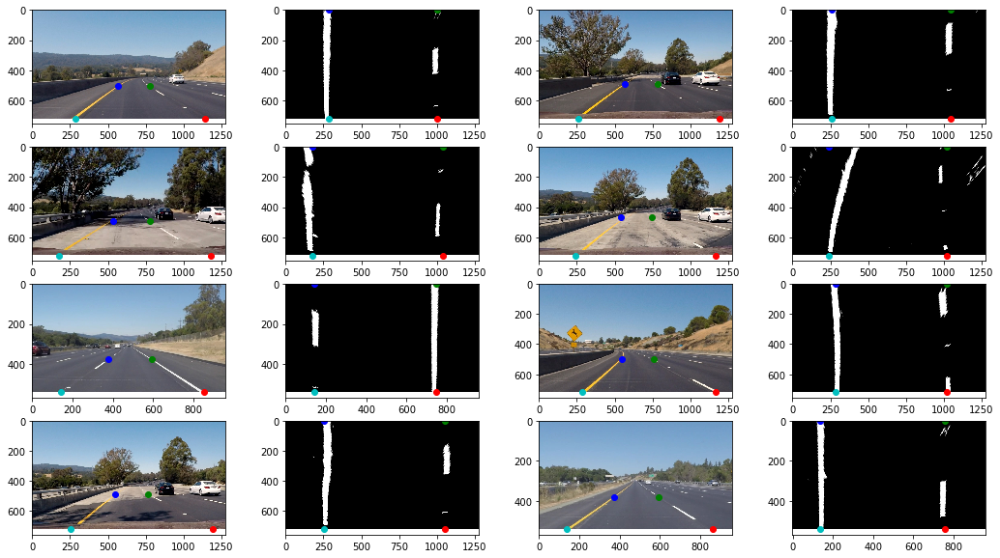

In [20]:
%matplotlib inline
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    afterProcess, src, dist = processImg(img, objPoints, imgPoints)
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    
    colors = ['ro','go','bo','co']
    for i in range(4):
        plt.plot(src[i,0],src[i,1],colors[i])
    
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
    
    for i in range(4):
        plt.plot(dist[i,0],dist[i,1],colors[i])
    

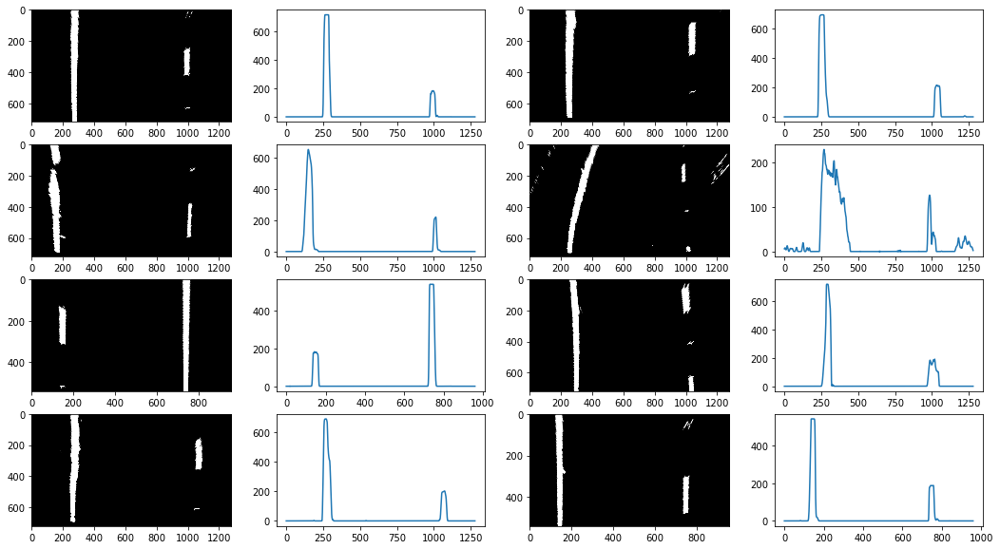

In [21]:
%matplotlib inline
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    afterProcess, src, dist = processImg(img, objPoints, imgPoints)
    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    histogram = np.sum(afterProcess[:,:], axis=0)
    plt.plot(histogram)   


In [22]:
nWindows = 9 # number of sliding windows
margin = 100 # Set the width of the windows +/- margin
minpix = 50 # Set minimum number of pixels found to recenter window

def slidingWindowsPeakHist(img, outImg, nWindows, margin, minpix, display=False):
    # input is a binary thresholded image
    # histogram = np.sum(img[np.int(img.shape[0]/2):,:], axis=0)
    histogram = np.sum(img, axis=0)
    # find stating points
    midpoint = np.int(histogram.shape[0]/2)
    leftxBase = np.argmax(histogram[:midpoint])
    rightxBase = np.argmax(histogram[midpoint:]) + midpoint
    
    windowHeight = np.int(img.shape[0]/nWindows)
    
    # print(histogram.shape)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    # print(nonzero)
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
     
    # init current network
    leftxCurrent = leftxBase
    rightxCurrent = rightxBase
    
    leftLaneInds = []
    rightLaneInds = []

    # Step through the windows one by one
    for window in range(nWindows):
        # Identify window boundaries in x and y (and right and left)
        winYlow = img.shape[0] - (window + 1) * windowHeight
        winYhigh = img.shape[0] - window * windowHeight
        
        winXleftLow = leftxCurrent - margin
        winXleftHigh = leftxCurrent + margin
        winXrightLow = rightxCurrent - margin
        winXrightHigh = rightxCurrent + margin
        
        # Draw the windows on the visualization image
        # print((winXleftLow,winYlow),(winXleftHigh,winYhigh))
        if display:
            cv2.rectangle(outImg,(winXleftLow,winYlow),(winXleftHigh,winYhigh),(1,255,1), 3) 
            cv2.rectangle(outImg,(winXrightLow,winYlow),(winXrightHigh,winYhigh),(1,255,1), 3) 
            # plt.imshow(outImg)
        
        # Identify the nonzero pixels in x and y within the window
        goodLeftInds = ((nonzeroy >= winYlow) & (nonzeroy < winYhigh) & (nonzerox >= winXleftLow) & (nonzerox < winXleftHigh)).nonzero()[0]
        goodRightInds = ((nonzeroy >= winYlow) & (nonzeroy < winYhigh) & (nonzerox >= winXrightLow) & (nonzerox < winXrightHigh)).nonzero()[0]
        
        # Append these indices to the lists
        leftLaneInds.append(goodLeftInds)
        rightLaneInds.append(goodRightInds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(goodLeftInds) > minpix:
            leftxCurrent = np.int(np.mean(nonzerox[goodLeftInds]))
        if len(goodRightInds) > minpix:        
            rightxCurrent = np.int(np.mean(nonzerox[goodRightInds]))

    # Concatenate the arrays of indices
    leftLaneInds = np.concatenate(leftLaneInds)
    rightLaneInds = np.concatenate(rightLaneInds)

    # Extract left and right line pixel positions
    leftx = nonzerox[leftLaneInds]
    lefty = nonzeroy[leftLaneInds] 
    rightx = nonzerox[rightLaneInds]
    righty = nonzeroy[rightLaneInds] 

    # Fit a second order polynomial to each
    leftFit = np.polyfit(lefty, leftx, 2)
    rightFit = np.polyfit(righty, rightx, 2)    
    
    if display == True:
        # Generate x and y values for plotting
        fity = np.linspace(0, img.shape[0]-1, img.shape[0] )
        fitLeftx = leftFit[0]*fity**2 + leftFit[1]*fity + leftFit[2]
        fitRightx = rightFit[0]*fity**2 + rightFit[1]*fity + rightFit[2]

        outImg[nonzeroy[leftLaneInds], nonzerox[leftLaneInds]] = [255, 255, 1]
        outImg[nonzeroy[rightLaneInds], nonzerox[rightLaneInds]] = [1, 255, 255]
        plt.imshow(outImg)
        plt.plot(fitLeftx, fity, color='yellow')
        plt.plot(fitRightx, fity, color='yellow')
        plt.xlim(0, img.shape[1])
        plt.ylim(img.shape[0], 0)

    return outImg, leftFit, rightFit, leftx, rightx, lefty, righty

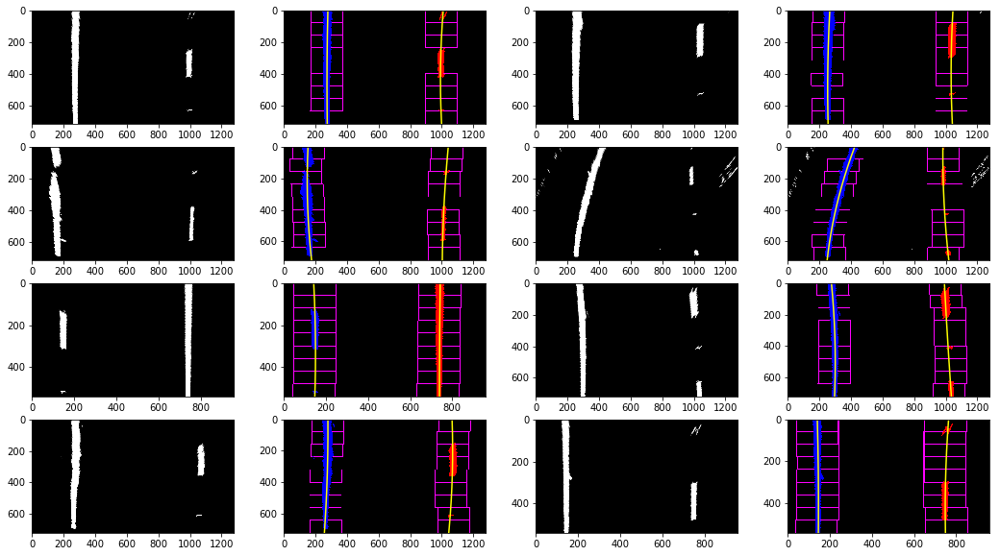

In [23]:
%matplotlib inline
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    afterProcess, src, dist = processImg(img, objPoints, imgPoints)
    outImg = np.dstack((afterProcess, afterProcess, afterProcess))*255
    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    outImg, leftFit, rightFit, leftX, rightX, leftY, rightY = slidingWindowsPeakHist(afterProcess, outImg, nWindows, margin, minpix, display = True)

In [24]:
def skipedFrame(img, outImg, leftFit, rightFit, margin, display=True):
    # Assume you now have a new warped binary image from the next frame of video 
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    leftLaneInds = ((nonzerox > (leftFit[0]*(nonzeroy**2) + leftFit[1]*nonzeroy + leftFit[2] - margin)) & (nonzerox < (leftFit[0]*(nonzeroy**2) + leftFit[1]*nonzeroy + leftFit[2] + margin))) 
    rightLaneInds = ((nonzerox > (rightFit[0]*(nonzeroy**2) + rightFit[1]*nonzeroy + rightFit[2] - margin)) & (nonzerox < (rightFit[0]*(nonzeroy**2) + rightFit[1]*nonzeroy + rightFit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[leftLaneInds]
    lefty = nonzeroy[leftLaneInds] 
    rightx = nonzerox[rightLaneInds]
    righty = nonzeroy[rightLaneInds]
    
    # Fit a second order polynomial to each
    leftFit = np.polyfit(lefty, leftx, 2)
    rightFit = np.polyfit(righty, rightx, 2)
    
    
    if display == True:
            # Generate x and y values for plotting
        fity = np.linspace(0, img.shape[0]-1, img.shape[0] )
        fitLeftX = leftFit[0]*fity**2 + leftFit[1]*fity + leftFit[2]
        fitRightX = rightFit[0]*fity**2 + rightFit[1]*fity + rightFit[2]
        
        windowImg = np.zeros_like(outImg)
        
        # Color in left and right line pixels
        outImg[nonzeroy[leftLaneInds], nonzerox[leftLaneInds]] = [255, 1, 1]
        outImg[nonzeroy[rightLaneInds], nonzerox[rightLaneInds]] = [1, 1, 255]

        # Generate a polygon to illustrate the search window area1
        # And recast the x and y points into usable format for cv2.fillPoly()
        leftLineWindow1 = np.array([np.transpose(np.vstack([fitLeftX-margin, fity]))])
        leftLineWindow2 = np.array([np.flipud(np.transpose(np.vstack([fitLeftX+margin, fity])))])
        leftLinePts = np.hstack((leftLineWindow1, leftLineWindow2))
        rightLineWindow1 = np.array([np.transpose(np.vstack([fitRightX-margin, fity]))])
        rightLineWindow2 = np.array([np.flipud(np.transpose(np.vstack([fitRightX+margin, fity])))])
        rightLinePts = np.hstack((rightLineWindow1, rightLineWindow2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(windowImg, np.int_([leftLinePts]), (1,255, 255))
        cv2.fillPoly(windowImg, np.int_([rightLinePts]), (1,255, 255))
        result = cv2.addWeighted(outImg, 1, windowImg, 0.1, 0)
        plt.imshow(result)
        plt.plot(fitLeftX, fity, color='yellow')
        plt.plot(fitRightX, fity, color='yellow')
        plt.xlim(0, img.shape[1])
        plt.ylim(img.shape[0], 0)
        outImg = result
    
    return outImg, leftFit, rightFit, leftx, rightx, lefty, righty

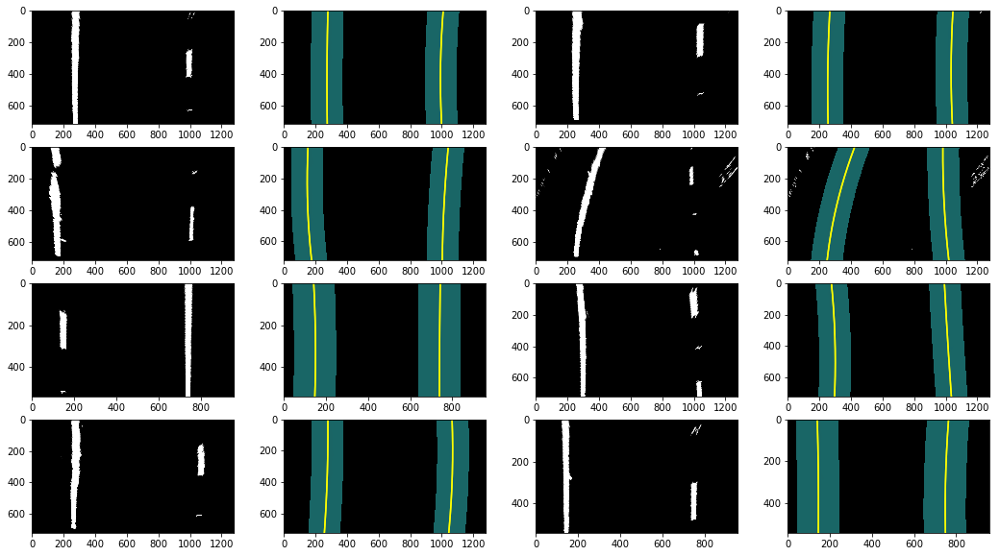

In [25]:
%matplotlib inline
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    afterProcess, src, dist = processImg(img, objPoints, imgPoints)
    outImg = np.dstack((afterProcess, afterProcess, afterProcess))*255
    # plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(afterProcess, cmap = 'gray') 
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    _, leftFit, rightFit, leftX, rightX, _, _ = slidingWindowsPeakHist(afterProcess, outImg, nWindows, margin, minpix, display = True)
    outImg = np.dstack((afterProcess, afterProcess, afterProcess))*255
    outImg, leftFit, rightFit, leftX, rightX, leftY, rightY = skipedFrame(afterProcess, outImg, leftFit, rightFit, margin, display = True)

In [26]:
# project back to the input image
def reverseProjector(undist, perspectiveInvMatrix, img, leftFit, rightFit, display = False):
    # inputs: 
        # img is binary warped
        # image is original image and undist
        # inverse perspective matrix
    fity = np.linspace(0, img.shape[0]-1, img.shape[0] )
    fitLeftX = leftFit[0]*fity**2 + leftFit[1]*fity + leftFit[2]
    fitRightx = rightFit[0]*fity**2 + rightFit[1]*fity + rightFit[2]  
    # Create an image to draw the lines on
    warpZero = np.zeros_like(img).astype(np.uint8)
    colorWarp = np.dstack((warpZero, warpZero, warpZero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    ptsLeft = np.array([np.transpose(np.vstack([fitLeftX, fity]))])
    ptsRight = np.array([np.flipud(np.transpose(np.vstack([fitRightx, fity])))])
    pts = np.hstack((ptsLeft, ptsRight))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(colorWarp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(colorWarp, perspectiveInvMatrix, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    if display == True:
        plt.imshow(result)
        
    return result

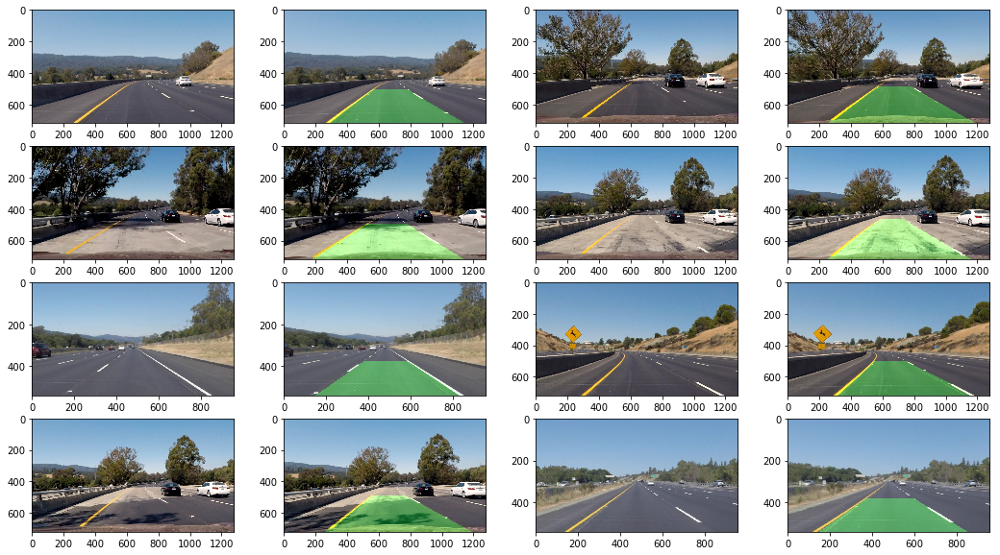

In [27]:
# Final Pipeline
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    undist = calUndistort(img, objPoints, imgPoints)
    undist = cv2.cvtColor(undist,cv2.COLOR_BGR2RGB)
    afterProcess, src, dist = processImg(img, objPoints, imgPoints)
    
    perspectiveMatrix = cv2.getPerspectiveTransform(src.astype(np.float32), dist.astype(np.float32))
    perspectiveInvMatrix = np.linalg.inv(perspectiveMatrix)
        
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) # plot original image  
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    
    outImg = np.dstack((afterProcess, afterProcess, afterProcess))*255
    outImg, leftFit, rightFit, leftX, rightX, leftY, rightY = slidingWindowsPeakHist(afterProcess, outImg, nWindows, margin, minpix, display = False)
    result = reverseProjector(undist, perspectiveInvMatrix, afterProcess, leftFit, rightFit, display = True)
    

In [28]:
def curvatureCalc(fity, leftX, rightX, leftY, rightY):
    # Define conversions in x and y from pixels space to meters
    ymPerPix = 30/720 # meters per pixel in y dimension
    xmPerPix = 3.7/700 # meters per pixel in x dimension
    
    yEval = np.max(fity)    
    
    # pixel space radious of curvature
    leftCurveRad = ((1+(2*leftFit[0]*yEval + leftFit[1]**2)**1.5)/np.absolute(2*leftFit[0]))
    rightCurveRad = ((1+(2*rightFit[0]*yEval + rightFit[1])**2)**1.5)/np.absolute(2*rightFit[0])

    # Fit new polynomials to x,y in world space
    leftFitCr = np.polyfit(leftY*ymPerPix, leftX*xmPerPix, 2)
    rightFitCr = np.polyfit(rightY*ymPerPix, rightX*xmPerPix, 2)
    
    # Calculate the new radii of curvature
    leftCurved = ((1 + (2*leftFitCr[0]*yEval*ymPerPix + leftFitCr[1])**2)**1.5) / np.absolute(2*leftFitCr[0])
    rightCurved = ((1 + (2*rightFitCr[0]*yEval*ymPerPix + rightFitCr[1])**2)**1.5) / np.absolute(2*rightFitCr[0])
    
    # Now our radius of curvature is in meters
    # print(leftCurved, 'm', rightCurved, 'm')
    return leftCurved, rightCurved

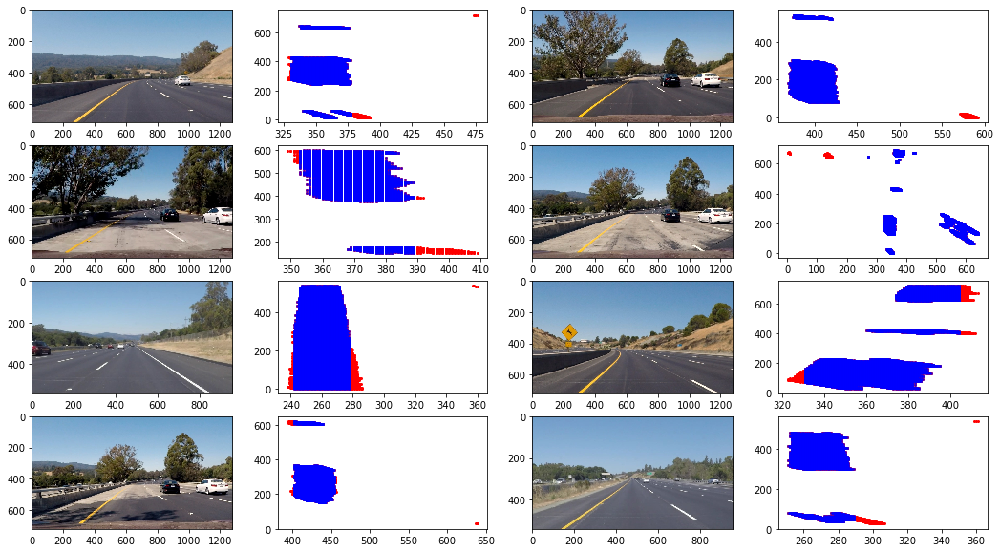

In [29]:
# filter points and reject outliers, test for right lane
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    undist = calUndistort(img, objPoints, imgPoints)
    undist = cv2.cvtColor(undist,cv2.COLOR_BGR2RGB)
    afterProcess, src, dist = processImg(img, objPoints, imgPoints)
    
    perspectiveMatrix = cv2.getPerspectiveTransform(src.astype(np.float32), dist.astype(np.float32))
    perspectiveInvMatrix = np.linalg.inv(perspectiveMatrix)
        
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) # plot original image  
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    
    
    afterProcess = afterProcess[:,np.int32(afterProcess.shape[1]/2):]
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = afterProcess.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #print(nonzerox, nonzerox.shape)

    meanXpnts = nonzerox.mean()
    stdXpnts = nonzerox.std()
    
    #print(meanXpnts, stdXpnts)

    # remove outlier points 
    goodPntsX = nonzerox[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]
    goodPntsY = nonzeroy[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]
    
    #print(goodPntsX, goodPntsX.shape, goodPntsY.shape)
    
    plt.plot(nonzerox, nonzeroy, 'o', color='red', markersize=2)
    plt.plot(goodPntsX, goodPntsY, 'x', color='blue', markersize=2)

    
    #outImg = np.dstack((afterProcess, afterProcess, afterProcess))*255
    #outImg, leftFit, rightFit, leftX, rightX, leftY, rightY = slidingWindowsPeakHist(afterProcess, outImg, nWindows, margin, minpix, display = False)
    #result = reverseProjector(undist, perspectiveInvMatrix, afterProcess, leftFit, rightFit, display = True)


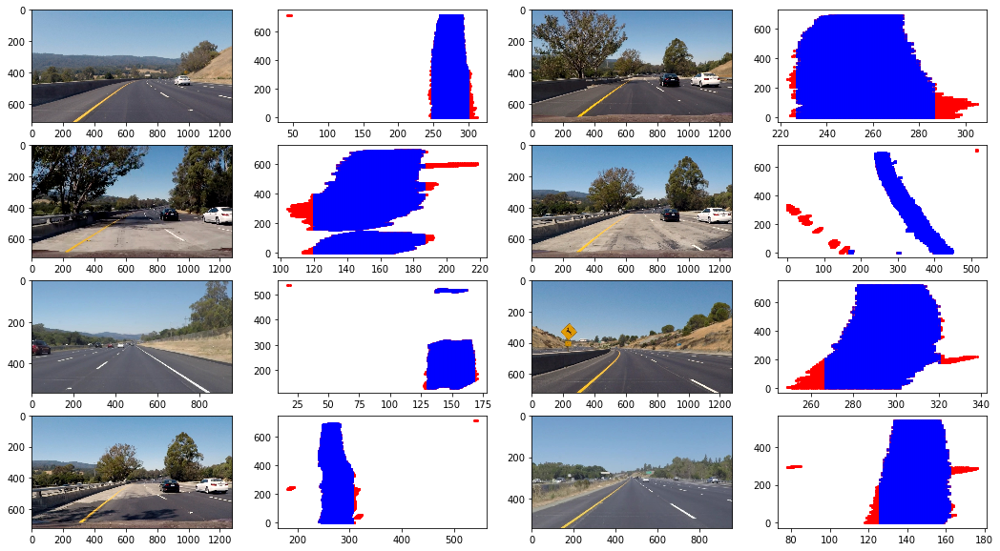

In [30]:
# filter points and reject outliers, test for left lane
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    undist = calUndistort(img, objPoints, imgPoints)
    undist = cv2.cvtColor(undist,cv2.COLOR_BGR2RGB)
    afterProcess, src, dist = processImg(img, objPoints, imgPoints)
    
    perspectiveMatrix = cv2.getPerspectiveTransform(src.astype(np.float32), dist.astype(np.float32))
    perspectiveInvMatrix = np.linalg.inv(perspectiveMatrix)
        
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) # plot original image  
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    
    
    afterProcess = afterProcess[:,0:np.int32(afterProcess.shape[1]/2)]
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = afterProcess.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #print(nonzerox, nonzerox.shape)

    meanXpnts = nonzerox.mean()
    stdXpnts = nonzerox.std()
    
    #print(meanXpnts, stdXpnts)

    # remove outlier points 
    goodPntsX = nonzerox[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]
    goodPntsY = nonzeroy[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]
    
    #print(goodPntsX, goodPntsX.shape, goodPntsY.shape)
    
    plt.plot(nonzerox, nonzeroy, 'o', color='red', markersize=2)
    plt.plot(goodPntsX, goodPntsY, 'x', color='blue', markersize=2)

    
    #outImg = np.dstack((afterProcess, afterProcess, afterProcess))*255
    #outImg, leftFit, rightFit, leftX, rightX, leftY, rightY = slidingWindowsPeakHist(afterProcess, outImg, nWindows, margin, minpix, display = False)
    #result = reverseProjector(undist, perspectiveInvMatrix, afterProcess, leftFit, rightFit, display = True)


In [31]:
# Final pipeline for images
# process image and design a template for output
def processImg(img):
    debug = False
    
    distPickle = pickle.load( open( "calibrator.pickle", "rb" ) )
    objPoints = distPickle["objectPoints"]
    imgPoints = distPickle["imagePoints"]
    
    # Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    # Apply the distortion correction to the raw image.
    undist = calUndistort(img, objPoints, imgPoints)
    # Use color transforms, gradients, etc., to create a thresholded binary image.
    thrBinary = combinedThreshBinaryImg(undist, threshX=(45, 255), threshY=(45, 255), threshColorS=(200,255), threshColorU=(0,110), threshColorR=(230,255))
    # Apply a perspective transform to rectify binary image ("birds-eye view").
    
    imgShape = img.shape
    
    # Configuration
    kernelSize = 5 # size of kernel for gaussian blur algorithm # 5
    lowThreshold = 95 # canny edge detection low threshold # 95
    highThreshold =  120 # canny edge detection high threshold # 120
    rho = 1 # distance resolution in pixels of the Hough grid # 1
    theta = np.pi/180 # angular resolution in radians of the Hough grid # np.pi/180
    threshold = 35    # minimum number of votes (intersections in Hough grid cell) # 10
    minLineLen = 20 # minimum number of pixels making up a line # 20
    maxLineGap = 40    # maximum gap in pixels between connectable line segments # 6
    thickness = 3
    alpha = 0 # my heuristic parameter for my special algorithm intelligentMask Detection to tune x mask position
    beta = 70 # 90 # my heuristic parameter for my special algorithm intelligentMask Detection to tune y mask position
    color = [255,0,0]
    boundaries = [
        ([196, 145, 10], [255, 245, 180]),
        ([220, 220, 220], [255, 255, 255])
    ] # colors we want to keep after pre processing
    
    # needs more attention: use thrbinary instead of image
    imgForMask = colorProcessing(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), boundaries)
    gray = grayScale(imgForMask) # convert image from RGB to gray
    grayG = gaussianBlur(gray, kernelSize) #Gaussian filter is applied to remove the scharp edges
    cannyImg = canny(grayG, lowThreshold, highThreshold) # apply canny edge detection algorithm
    lines = cv2.HoughLinesP(cannyImg, rho, theta, threshold, np.array([]), minLineLength=minLineLen, maxLineGap=maxLineGap)
    

    # Intelligent Masking
    source, xIntersect, yIntersect, status = intelligentMaskDetection(lines,cannyImg.shape,alpha,beta)
    distination = np.array([(source[0][0]-imgShape[0]/5,source[0][1]), (source[0][0]-imgShape[0]/5,0), (source[3][0],0), (source[3][0],source[3][1])])
    # print(source, distination)
    
    
    
    if status == 0: # oops my algorithm failed, DO it manually in that case
        # Manual Masking
        source = np.float32([[(imgShape[1] / 2) - 55, imgShape[0] / 2 + 100],
                          [((imgShape[1] / 6) - 10), imgShape[0]],
                          [(imgShape[1] * 5 / 6) + 60, imgShape[0]],
                          [(imgShape[1] / 2 + 55), imgShape[0] / 2 + 100]])
        distination = np.float32([[(imgShape[1] / 4), 0],
                          [(imgShape[1] / 4), imgShape[0]],
                          [(imgShape[1] * 3 / 4), imgShape[0]],
                          [(imgShape[1] * 3 / 4), 0]])
    
    # result = cv2.cvtColor(regionOFInterest(img, source, 255), cv2.COLOR_BGR2RGB)
    # OR
    # result = thrBinary
    # cv2.polylines(result, np.array([source]), False, 1, 212)
    
    # result = cv2.polylines(thrBinary, np.array([src]), False, 1, 2)
    perspectiveMatrix = cv2.getPerspectiveTransform(source.astype(np.float32), distination.astype(np.float32))
    perspectiveInvMatrix = np.linalg.inv(perspectiveMatrix)
    result = cv2.warpPerspective(thrBinary, perspectiveMatrix, (thrBinary.shape[1], thrBinary.shape[0]))

    
    # if debug == True:
        # histogram = np.sum(result[:,:], axis=0) # this is for debugging only
    
    # Detect lane pixels and fit to find /lane boundary.
    outImg = np.dstack((result, result, result))*255
    outImg, leftFit, rightFit, leftX, rightX, leftY, rightY = slidingWindowsPeakHist(result, outImg, nWindows, margin, minpix, display = False)

    # Determine curvature of the lane and vehicle position with respect to center.
    fity = np.linspace(0, img.shape[0]-1, img.shape[0] )
    
    leftCurved, rightCurved = 0,0 #curvatureCalc(fity, leftX, rightX, leftY, rightY)
    
    # Warp the detected lane boundaries back onto the original image.
    result = reverseProjector(undist, perspectiveInvMatrix, result, leftFit, rightFit, display = False)
    
    
        
    # for debugging
    if debug == True:
        colors = [[255,1,1],[1,255,1],[1,1,255],[255,255,1]]
        for i in range(4):
            cv2.circle(outImg, (np.int32(distination[i,0]),np.int32(distination[i,1])), 5, colors[i], -1)
            
        colors = [[255,1,1],[1,255,1],[1,1,255],[255,255,1]]
        for i in range(4):
            cv2.circle(result, (np.int32(source[i,0]),np.int32(source[i,1])), 5, colors[i], -1)
    
    # Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    # print(img.shape[0], img.shape[1])
    # template builder
    keepAllResults = np.zeros((img.shape[0]+80, img.shape[1] + np.int32(img.shape[1]/2), 3), dtype=np.uint8)
    outputResult = cv2.resize(result, (img.shape[1], img.shape[0]))
    
    if debug == True:
        # histogramResults = cv2.resize(histogram, (40,))
        # this is for future work, show histogram plot online
        
        perspectiveResult = cv2.resize(outImg, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = cv2.resize(thrBinary, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = np.dstack([binaryResult,binaryResult,binaryResult]) * 255        
        keepAllResults[0:np.int32(img.shape[0]/2), img.shape[1]:, :] = perspectiveResult
        keepAllResults[np.int32(img.shape[0]/2):img.shape[0], img.shape[1]:, :] = binaryResult
    else:
        perspectiveResult = cv2.resize(outImg, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = cv2.resize(thrBinary, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = np.dstack([binaryResult,binaryResult,binaryResult]) * 255        
        keepAllResults[0:np.int32(img.shape[0]/2), img.shape[1]:, :] = perspectiveResult
        keepAllResults[np.int32(img.shape[0]/2):img.shape[0], img.shape[1]:, :] = binaryResult
    
    keepAllResults[0:img.shape[0], 0:img.shape[1], :] = outputResult
    
    distFromCenter = 0 
    cv2.putText(keepAllResults, "Center Distance: {:.2f}m, Left ROC: {:.2f}m, Right ROC: {:.2f}m".format(
        leftCurved, rightCurved, distFromCenter), (40, img.shape[0]+50), cv2.FONT_HERSHEY_TRIPLEX, 0.5, (255, 255, 255), 2)
    
    return keepAllResults, source, distination



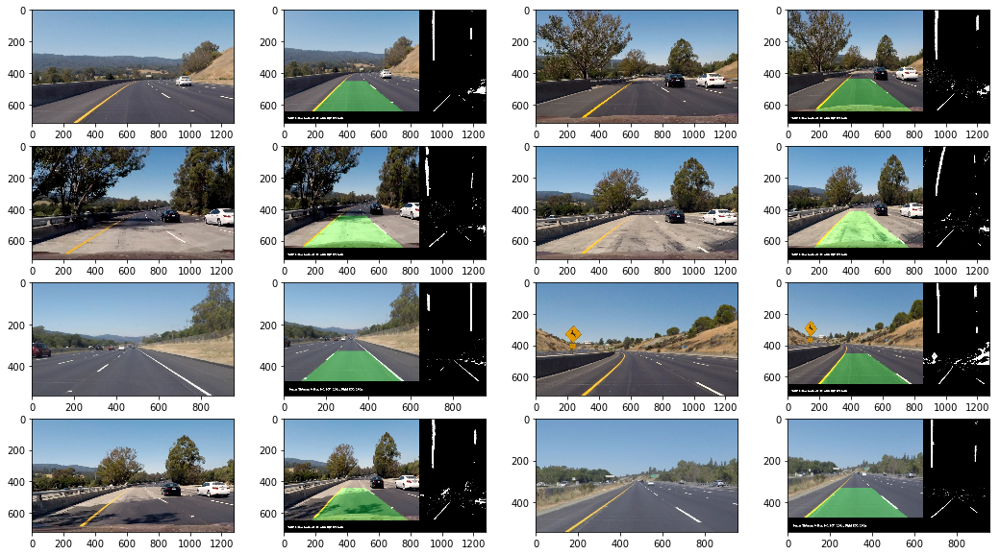

In [32]:
# Final Pipeline
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './test_images/*.jpg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2)
# print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    keepAllResults, source, distination = processImg(img)
        
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) # plot original image  
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    
    #plt.figure()
    outputResult = cv2.resize(keepAllResults, (img.shape[1], img.shape[0]))
    plt.imshow(cv2.cvtColor(outputResult,cv2.COLOR_BGR2RGB)) 
    #plt.savefig('output_images/'+ str(counter) + '.jpg')
    #counter += 1

In [33]:
class Line():  
    # Define conversions in x and y from pixels space to meters
    previousFrameFlag = True # True for image sequence
    
    ymPerPix = 30/720 # meters per pixel in y dimension
    xmPerPix = 3.7/700 # meters per pixel in x dimension
    
    historyKeepLimit = 20 # memory management and quality assurance ;d
    
    nWindows = 9 # number of sliding windows
    margin = 100 # Set the width of the windows +/- margin
    minpix = 50 # Set minimum number of pixels found to recenter window
    
    considerLastNfits = 20 # limit averaging fits, only consider last n fits
    confidenceThreshold = 0.4 # this is a value to determine confidence
    
    smoothLimiter = 6
    
    
    
    def __init__(self):
        
        self.inputImg = None # image for the input, 
        self.histogram = None # keep histogram for the input image
        self.outputImg = None # only for debugging

        self.frameCounter = 0
        self.detected = False  # was the line detected in the last iteration?
        self.confidence = 0
        self.recentXfitted = [] # x values of the last n fits of the line
        self.bestx = []     # average x values of the fitted line over the last n iterations
        self.bestFit = [np.array([False])]   # polynomial coefficients averaged over the last n iterations
        self.currentFit = [np.array([False])]   # polynomial coefficients for the most recent fit
        self.previousFit = [np.array([False])] # polynomial coefficients for the previous fit
        self.radiusOFCurvature = None # radius of curvature of the line in some units
        self.radiusOFcurvatureHist = []
        self.lineBasePos = None # distance in meters of vehicle center from the line
        self.diffs = np.array([0,0,0], dtype='float')  # difference in fit coefficients between last and new fits
        self.allx = []  # x values for detected line pixels
        self.ally = [] # y values for detected line pixels
        self.x = []
        self.y = []
        
    def plotInputImg(self):
        plt.imshow(self.inputImg)
        
    def setInputImage(self, img): # you should first call this function after instantiate 
        self.inputImg = img
        self.histogram = np.sum(img, axis=0)
        self.outputImg = np.zeros_like(img)
        
    def update(self): # sanity check and limitation check
        if (self.frameCounter > 1) and (self.confidence > 0.55):
            self.recentXfitted = self.recentXfitted[-self.considerLastNfits:]
            # need more work to do
            #self.bestx = np.array(self.allx[-self.considerLastNfits:]).mean(axis=0)
            #self.bestFit = np.array(self.allx[-self.considerLastNfits:]).mean(axis=0)
            
        self.radiusOFcurvatureHist = self.radiusOFcurvatureHist[-self.historyKeepLimit:]
        
        # if (not any(self.currentFit)) and (not any(self.previousFit)): # just make sure they were sets before use
        self.diffs =  self.currentFit - self.previousFit
        
        # print(self.allx[-1])
        self.lineBasePos = np.absolute(self.inputImg.shape[1] - np.array(self.allx[-1]).mean()) * self.xmPerPix # image width 
        
        
        
    def radiusOFcurvatureMeasure(self):
        maxEval = self.inputImg.shape[0] # bottom of the image
        fitCurve = np.polyfit(self.y * self.ymPerPix, self.x * self.xmPerPix, 2)
        radiusOFcurvature = ((1 + (2 * fitCurve[0] * maxEval * self.ymPerPix + fitCurve[1])**2)**1.5) / np.absolute(2*fitCurve[0])
        
        self.radiusOFcurvature =  radiusOFcurvature #  set self.ROC
        self.radiusOFcurvatureHist.append(radiusOFcurvature)
        self.update() # limit the size of ROC
        
        return radiusOFcurvature
    
    # def smoothingApproach(self): # smoothing the results based on history
        
        
    
    def intelligentSliding(self): # according to some parameters choose between sliding or searching
        
        
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = self.inputImg.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        self.x = nonzerox
        self.y = nonzeroy
        
        meanXpnts = nonzerox.mean()
        stdXpnts = nonzerox.std()
        
        #print(meanXpnts, stdXpnts)
        
        # remove outlier points 
        x = nonzerox[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]
        y = nonzeroy[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]
        
       
        # plt.plot(x, y, 'o', color='red', markersize=1)
        
        #print(x,y.size)
        self.confidence = y.size/self.inputImg.shape[0] # normalized confidence
        
        if (x.size < 10) or (y.size < 10):
            if self.frameCounter == 0:
                return None, None, None, -1 # operation was unsuccessful
            else:
                #print(self.previousFit, self.allx, self.ally)
                self.x, self.y = self.allx[-1], self.ally[-1]
                return self.previousFit, self.allx[-1], self.ally[-1], 0
        
        
        
        if (self.confidence > 0.6) and (self.frameCounter > 20) and (self.previousFrameFlag):
            # use the previous frame
            polyFit, x, y = self.skipedFrame()
        elif (self.confidence > self.confidenceThreshold) or (self.frameCounter == 0):
            polyFit, x, y = self.slidingWindowsPeakHist()
        else:
            polyFit, x, y = self.skipedFrame()
        
        
        # smoothing result
        if self.frameCounter > self.smoothLimiter:
            polyFit = np.array(self.recentXfitted[-self.smoothLimiter:]).mean(axis=0) * 0.2 + polyFit * 0.8
        
        self.frameCounter = self.frameCounter + 1
        self.recentXfitted.append(polyFit)
        
        return polyFit, x, y, 1
        
        

    def slidingWindowsPeakHist(self):
        # input is a binary thresholded image
        
        # find stating points
        xBase = np.argmax(self.histogram)
        windowHeight = np.int(self.inputImg.shape[0]/self.nWindows)

        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = self.inputImg.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        meanXpnts = nonzerox.mean()
        stdXpnts = nonzerox.std()
        
        # remove outlier points 
        x = nonzerox[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]
        y = nonzeroy[np.abs(nonzerox-meanXpnts) < 1.8*stdXpnts]     

        if (x.size < 10) or (y.size < 10):
            if self.frameCounter == 0:
                return None, None, None, -1 # operation was unsuccessful
            else:
                #print(self.previousFit, self.allx, self.ally)
                self.x, self.y = self.allx[-1], self.ally[-1]
                return self.previousFit, self.allx[-1], self.ally[-1], 0

        nonzeroy, nonzerox = y, x

        # init current network
        xCurrent = xBase
        laneInds = []

        # Step through the windows one by one
        for window in range(self.nWindows):
            # Identify window boundaries in x and y (and right and left)
            winYlow = self.inputImg.shape[0] - (window + 1) * windowHeight
            winYhigh = self.inputImg.shape[0] - window * windowHeight

            winXlow =  xCurrent - self.margin
            winXhigh =  xCurrent + self.margin

            # Draw the windows on the visualization image
            cv2.rectangle(self.outputImg,(winXlow,winYlow),(winXhigh,winYhigh),(1,255,1), 3) 

            # Identify the nonzero pixels in x and y within the window
            goodInds = ((nonzeroy >= winYlow) & (nonzeroy < winYhigh) & (nonzerox >= winXlow) & (nonzerox < winXhigh)).nonzero()[0]

            # Append these indices to the lists
            laneInds.append(goodInds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(goodInds) > minpix:
                xCurrent = np.int(np.mean(nonzerox[goodInds]))

        # Concatenate the arrays of indices
        laneInds = np.concatenate(laneInds)

        # Extract left and right line pixel positions
        x = nonzerox[laneInds]
        y = nonzeroy[laneInds] 
        
        # Fit a second order polynomial to each
        polyFit = np.polyfit(y, x, 2)
        self.confidence = y.size/self.inputImg.shape[0] # normalized confidence 
        if self.confidence > self.confidenceThreshold:
            self.previousFit = self.currentFit
            self.currentFit = polyFit
            self.detected = True
            self.allx.append(x)
            self.ally.append(y)
            self.update()
        
        return polyFit, x, y
    def skipedFrame(self):
        # Assume you now have a new warped binary image from the next frame of video 
        nonzero = self.inputImg.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])

        laneInds = ((nonzerox > (self.previousFit[0]*(nonzeroy**2) + self.previousFit[1]*nonzeroy + self.previousFit[2] - self.margin)) & (nonzerox < (self.previousFit[0]*(nonzeroy**2) + self.previousFit[1]*nonzeroy + self.previousFit[2] + self.margin))) 

        # Again, extract left and right line pixel positions
        x = nonzerox[laneInds]
        y = nonzeroy[laneInds] 

        if (x.size < 10) or (y.size < 10):
            polyFit = self.previousFit
        else:        
            # Fit a second order polynomial to each
            polyFit = np.polyfit(y, x, 2)
        
        self.confidence = self.confidence - 0.1 # punish algorithm for using the same frame
        
        return polyFit, x, y

    

In [34]:
# final pipeline for video

# initiate instance
leftLine = Line()
rightLine = Line()

def videoProcess(img):
    debug = False
    
    distPickle = pickle.load( open( "calibrator.pickle", "rb" ) )
    objPoints = distPickle["objectPoints"]
    imgPoints = distPickle["imagePoints"]
    
    # Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
    # Apply the distortion correction to the raw image.
    undist = calUndistort(img, objPoints, imgPoints)
    # Use color transforms, gradients, etc., to create a thresholded binary image.
    thrBinary = combinedThreshBinaryImg(undist, threshX=(45, 255), threshY=(45, 255), threshColorS=(200,255), threshColorU=(0,110), threshColorR=(230,255))
    # Apply a perspective transform to rectify binary image ("birds-eye view").
    
    imgShape = img.shape
    
    # Configuration
    kernelSize = 5 # size of kernel for gaussian blur algorithm # 5
    lowThreshold = 95 # canny edge detection low threshold # 95
    highThreshold =  120 # canny edge detection high threshold # 120
    rho = 1 # distance resolution in pixels of the Hough grid # 1
    theta = np.pi/180 # angular resolution in radians of the Hough grid # np.pi/180
    threshold = 35    # minimum number of votes (intersections in Hough grid cell) # 10
    minLineLen = 20 # minimum number of pixels making up a line # 20
    maxLineGap = 40    # maximum gap in pixels between connectable line segments # 6
    thickness = 3
    alpha = 0 # my heuristic parameter for my special algorithm intelligentMask Detection to tune x mask position
    beta = 70 # 90 # my heuristic parameter for my special algorithm intelligentMask Detection to tune y mask position
    color = [255,0,0]
    boundaries = [
        ([196, 145, 10], [255, 245, 180]),
        ([220, 220, 220], [255, 255, 255])
    ] # colors we want to keep after pre processing
    
    # needs more attention: use thrbinary instead of image
    imgForMask = colorProcessing(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB), boundaries)
    gray = grayScale(imgForMask) # convert image from RGB to gray
    grayG = gaussianBlur(gray, kernelSize) #Gaussian filter is applied to remove the scharp edges
    cannyImg = canny(grayG, lowThreshold, highThreshold) # apply canny edge detection algorithm
    lines = cv2.HoughLinesP(cannyImg, rho, theta, threshold, np.array([]), minLineLength=minLineLen, maxLineGap=maxLineGap)
    

    # Intelligent Masking
    #source, xIntersect, yIntersect, status = intelligentMaskDetection(lines,cannyImg.shape,alpha,beta)
    #distination = np.array([(source[0][0]-imgShape[0]/5,source[0][1]), (source[0][0]-imgShape[0]/5,0), (source[3][0],0), (source[3][0],source[3][1])])
    # print(source, distination)
    
    #if status == 0: # oops my algorithm failed, DO it manually in that case
        # Manual Masking
        # print('HOops')
    source = np.float32([[(imgShape[1] / 2) - 55, imgShape[0] / 2 + 100],
                      [((imgShape[1] / 6) - 10), imgShape[0]],
                      [(imgShape[1] * 5 / 6) + 60, imgShape[0]],
                      [(imgShape[1] / 2 + 55), imgShape[0] / 2 + 100]])
    distination = np.float32([[(imgShape[1] / 4), 0],
                      [(imgShape[1] / 4), imgShape[0]],
                      [(imgShape[1] * 3 / 4), imgShape[0]],
                      [(imgShape[1] * 3 / 4), 0]])
        
        # print(source, distination)

    # result = cv2.cvtColor(regionOFInterest(img, source, 255), cv2.COLOR_BGR2RGB)
    # OR
    # result = thrBinary
    # cv2.polylines(result, np.array([source]), False, 1, 212)
    
    # result = cv2.polylines(thrBinary, np.array([src]), False, 1, 2)
    perspectiveMatrix = cv2.getPerspectiveTransform(source.astype(np.float32), distination.astype(np.float32))
    perspectiveInvMatrix = np.linalg.inv(perspectiveMatrix)
    perspectiveResult = cv2.warpPerspective(thrBinary, perspectiveMatrix, (thrBinary.shape[1], thrBinary.shape[0]))

    perspectiveResultHalf = np.zeros_like(perspectiveResult)
    perspectiveResultHalf[:,0:np.int32(perspectiveResult.shape[1]/2)] = perspectiveResult[:,0:np.int32(perspectiveResult.shape[1]/2)]
    
    leftLine.setInputImage(perspectiveResultHalf)
    
    perspectiveResultHalf = np.zeros_like(perspectiveResult)
    perspectiveResultHalf[:,np.int32(perspectiveResult.shape[1]/2):] = perspectiveResult[:,np.int32(perspectiveResult.shape[1]/2):]
    
    rightLine.setInputImage(perspectiveResultHalf)
    
    leftFit, leftX, leftY, leftStatus = leftLine.intelligentSliding()
    rightFit, rightX, rightY, rightStatus = rightLine.intelligentSliding()
    
    #leftFit, leftX, leftY = leftLine.skipedFrame()
    #rightFit, rightX, rightY = rightLine.skipedFrame()
        
    #diff = np.abs(rightFit-leftFit)  
    #print(diff)
    if (leftStatus == -1) and (rightStatus == -1):
        print('WHY ME :(')  
    elif leftStatus == -1:
        leftFit = rightFit - [  5.10602184e-05, 9.61168073e-02, 8.11934274e+02] # experimental needs more work
        rightCurved = rightLine.radiusOFcurvatureMeasure()
        leftCurved =  rightCurved + 3000
        #print(rightFit)
    elif rightStatus == -1:
        rightFit = leftFit + [  5.10602184e-05, 9.61168073e-02, 8.11934274e+02] # experimental needs more work
        leftCurved = leftLine.radiusOFcurvatureMeasure()
        rightCurved = leftCurved - 3000
        #print(leftFit)
    else:    
        leftCurved = leftLine.radiusOFcurvatureMeasure()
        rightCurved = rightLine.radiusOFcurvatureMeasure()
        
        #diff1 = leftCurved - rightCurved
        #diff2 = rightCurved - leftCurved
        #print(leftCurved,rightCurved,diff1,diff2)
    
    # Warp the detected lane boundaries back onto the original image.
    result = reverseProjector(undist, perspectiveInvMatrix, perspectiveResult, leftFit, rightFit, display = False)
        
    # for debugging
    if debug == True:
        colors = [[255,1,1],[1,255,1],[1,1,255],[255,255,1]]
        for i in range(4):
            cv2.circle(perspectiveResult, (np.int32(distination[i,0]),np.int32(distination[i,1])), 10, colors[i], -1)
            
        colors = [[255,1,1],[1,255,1],[1,1,255],[255,255,1]]
        for i in range(4):
            cv2.circle(result, (np.int32(source[i,0]),np.int32(source[i,1])), 10, colors[i], -1)
    
    # Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    # print(img.shape[0], img.shape[1])
    # template builder
    keepAllResults = np.zeros((img.shape[0]+80, img.shape[1] + np.int32(img.shape[1]/2), 3), dtype=np.uint8)
    outputResult = cv2.resize(result, (img.shape[1], img.shape[0]))
    
    if debug == True:
        # histogramResults = cv2.resize(histogram, (40,))
        # this is for future work, show histogram plot online   
        persRes = np.dstack([perspectiveResult,perspectiveResult,perspectiveResult]) * 255        
        perspectiveResultFinal = cv2.resize(persRes, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = cv2.resize(thrBinary, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = np.dstack([binaryResult,binaryResult,binaryResult]) * 255        
        keepAllResults[0:np.int32(img.shape[0]/2), img.shape[1]:, :] = perspectiveResultFinal
        keepAllResults[np.int32(img.shape[0]/2):img.shape[0], img.shape[1]:, :] = binaryResult
    else:
        persRes = np.dstack([perspectiveResult,perspectiveResult,perspectiveResult]) * 255        
        perspectiveResultFinal = cv2.resize(persRes, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = cv2.resize(thrBinary, (np.int32(img.shape[1]/2), np.int32(img.shape[0]/2)))
        binaryResult = np.dstack([binaryResult,binaryResult,binaryResult]) * 255        
        keepAllResults[0:np.int32(img.shape[0]/2), img.shape[1]:, :] = perspectiveResultFinal
        keepAllResults[np.int32(img.shape[0]/2):img.shape[0], img.shape[1]:, :] = binaryResult
    
    keepAllResults[0:img.shape[0], 0:img.shape[1], :] = outputResult
    
    # x-coordinate of the lane line at the bottom of the screen
    # print(img.shape)
    bottom = img.shape[0]
    bottomLeft = leftFit[0]*bottom**2 + leftFit[1]*bottom + leftFit[2]
    bottomRight = rightFit[0]*bottom**2 + rightFit[1]*bottom + rightFit[2]
    
    centerLane = (bottomRight - bottomLeft)/2 + bottomLeft 
    carLocation = img.shape[1]/2
    # consider this is centimeter
    distFromCenter = ( np.abs(carLocation) - np.abs(centerLane)) * (3.7/700) * 100 # center location - center of lane
    # print(img.shape[1], centerLane, carLocation, bottomLeft, bottomRight, distFromCenter)

    cv2.putText(keepAllResults, "Center Distance: {:.2f} cm, Left ROC: {:.2f}m, Right ROC: {:.2f}m".format(
        distFromCenter, leftCurved, rightCurved), (40, img.shape[0]+50), cv2.FONT_HERSHEY_TRIPLEX, 0.5, (255, 255, 255), 2)
    
    return keepAllResults

10 (5, 4)


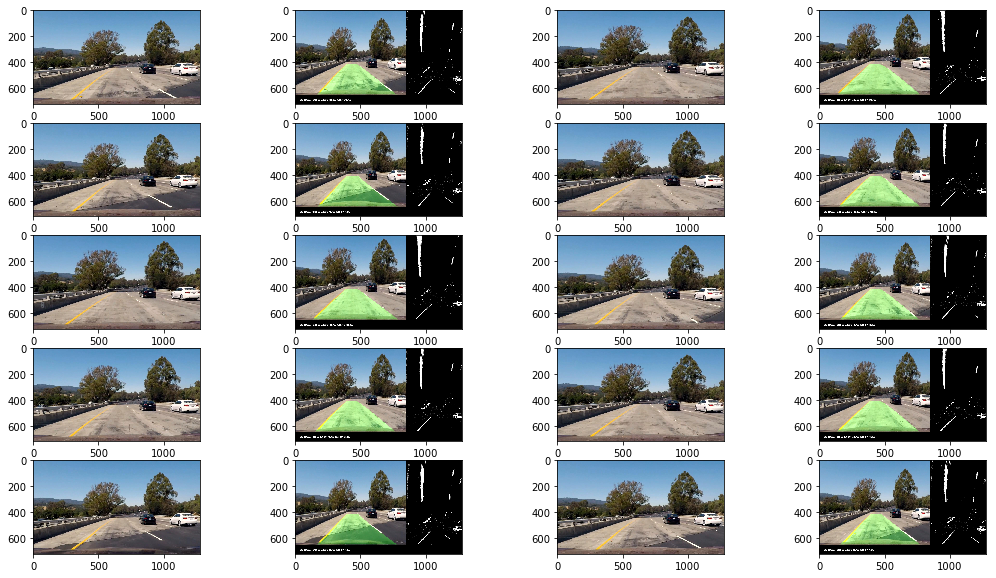

In [40]:
# Final Pipeline
%matplotlib inline
import glob
import numpy as np
import matplotlib.pyplot as plt

directory = './videoSeq/*.jpeg'
globDir = glob.glob(directory)
factors = factorsFind(len(globDir)*2) # [::-1] # reverse tuple
print(len(globDir),factors)
fig = plt.figure(figsize=(18, 10))
counter = 1
for filename in globDir:
    img = cv2.imread(filename)
    keepAllResults = videoProcess(img)
        
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB)) # plot original image  
      
    fig.add_subplot(factors[0],factors[1],counter)
    counter += 1
    
    outputResult = cv2.resize(keepAllResults, (img.shape[1], img.shape[0]))
    plt.imshow(cv2.cvtColor(outputResult,cv2.COLOR_BGR2RGB))

In [36]:
# in case if you have not ffmpeg in your computer
import imageio 
imageio.plugins.ffmpeg.download()

In [37]:
def combinedThreshBinaryImg(img, threshX=(20, 100), threshY=(20, 100), threshColorS=(170,255), threshColorU=(0,110), threshColorR=(230,255)):
    # Convert to HLS color space and separate the H channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    rgb = img.astype(np.float)
    yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV).astype(np.float)
    # H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    R = rgb[:,:,0]
    U = yuv[:,:,1]
    # Sobel 
    sobelX = absSobelThresh(img, orient='x', thresh=(threshX[0], threshX[1]))
    sobelY = absSobelThresh(img, orient='y', thresh=(threshY[0], threshY[1]))

    # Threshold color channel
    sBinary = np.zeros_like(S)
    sBinary[(S >= threshColorS[0]) & (S <= threshColorS[1])] = 1
    
    rBinary = np.zeros_like(R)
    rBinary[(R >= threshColorR[0]) & (R <= threshColor[1])] = 1
    
    uBinary = np.zeros_like(U)
    uBinary[(U >= threshColorU[0]) & (U <= threshColorU[1])] = 1    
    
    colorBinary = np.dstack(( rBinary, ((sobelX == 1) & (sobelY == 1)), uBinary ))
    # if you want to see colorful Output uncomment this line
    # return colorBinary
    
    # Combine the two binary thresholds 
    combinedBinary = np.zeros_like(sBinary)
    combinedBinary[(rBinary == 1) | (uBinary == 1) | ((sobelX == 1) & (sobelY == 1))] = 1
    
    return combinedBinary

In [38]:
# process videos
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# initiate instance
leftLine = Line()
rightLine = Line()

# video processing
output = 'output_videos/project_mine.mp4'
clip = VideoFileClip("project_video.mp4")
clip = clip.fl_image(videoProcess)
clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/project_mine.mp4
[MoviePy] Writing video output_videos/project_mine.mp4


100%|█████████▉| 1260/1261 [25:08<00:01,  1.18s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_mine.mp4 



In [37]:
# process videos
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# initiate instance
leftLine = Line()
rightLine = Line()

# video processing
output = 'output_videos/challenge_mine.mp4'
clip = VideoFileClip("challenge_video.mp4")
clip = clip.fl_image(videoProcess)
clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/challenge_mine.mp4
[MoviePy] Writing video output_videos/challenge_mine.mp4


100%|██████████| 485/485 [09:24<00:00,  1.14s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_mine.mp4 



In [38]:
# process videos
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# initiate instance
leftLine = Line()
rightLine = Line()

# video processing
output = 'output_videos/harder_challenge_mine.mp4'
clip = VideoFileClip("harder_challenge_video.mp4")
clip = clip.fl_image(videoProcess)
clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_videos/harder_challenge_mine.mp4
[MoviePy] Writing video output_videos/harder_challenge_mine.mp4


100%|█████████▉| 1199/1200 [23:32<00:01,  1.16s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_mine.mp4 



In [ ]:
'''
Sanity Check:
    Checking that they have similar curvature
    Checking that they are separated by approximately the right distance horizontally
    Checking that they are roughly parallel
'''